<a href="https://colab.research.google.com/github/marireeves/BirdDetections/blob/main/BirdDetector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Bird Detection in High Resolution Airborne Imagery

The Weecology lab at the University of Florida is building a bird detector in high resolution airborne imagery. We use the Deepforest package to make the most current model available. This model has been trained on tens of thousands of annotated bird images from around the world and is applicable to individual bird detection in 1-3cm resolution data. For more information see https://github.com/weecology/BirdDetector

# Install and load packages

Rememeber to turn on GPU support, Runtime -> Change RunTime Type -> Gpu

In [1]:
pip install --upgrade deepforest albumentations PyYAML

     |████████████████████████████████| 20.0MB 30.1MB/s 
     |████████████████████████████████| 102kB 13.7MB/s 
     |████████████████████████████████| 645kB 49.4MB/s 
     |████████████████████████████████| 1.0MB 47.7MB/s 
     |████████████████████████████████| 28.5MB 104kB/s 
     |████████████████████████████████| 19.3MB 161kB/s 
     |████████████████████████████████| 819kB 53.8MB/s 
     |████████████████████████████████| 30.0MB 93kB/s 
     |████████████████████████████████| 1.0MB 47.2MB/s 
     |████████████████████████████████| 38.2MB 62.2MB/s 
     |████████████████████████████████| 15.4MB 128kB/s 
     |████████████████████████████████| 6.6MB 20.9MB/s 
     |████████████████████████████████| 235kB 55.7MB/s 
     |████████████████████████████████| 10.6MB 208kB/s 
     |████████████████████████████████| 829kB 55.3MB/s 
     |████████████████████████████████| 122kB 51.5MB/s 
     |████████████████████████████████| 1.3MB 40.4MB/s 
     |████████████████████████████████| 296kB 5

## Load modules

In [2]:
from deepforest import main
import rasterio
from matplotlib import pyplot
import numpy as np

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/metrics/__init__.py:44: LightningDeprecationWarning: `pytorch_lightning.metrics.*` module has been renamed to `torchmetrics.*` and split off to its own package (https://github.com/PyTorchLightning/metrics) since v1.3 and will be removed in v1.5
  "`pytorch_lightning.metrics.*` module has been renamed to `torchmetrics.*` and split off to its own package"


# Create DeepForest Model

In [3]:
m = main.deepforest()

Reading config file: /usr/local/lib/python3.7/dist-packages/deepforest/data/deepforest_config.yml


Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_coco-eeacb38b.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_coco-eeacb38b.pth


# Download latest release

In [4]:
m.use_bird_release()

bird.pt: 0.00B [00:00, ?B/s]

bird.pt: 129MB [00:02, 61.2MB/s]                           


Model was downloaded and saved to /usr/local/lib/python3.7/dist-packages/deepforest/data/bird.pt
Loading pre-built model: https://github.com/weecology/BirdDetector/releases/tag/1.0.7


# Download pelican image

In [5]:
!wget https://www.dropbox.com/s/y6tt566khmt1ecn/AWPE%20Pigeon%20Lake%202020%20DJI_0005_crop.JPG?dl=0 -O pelicans.jpg

--2021-06-30 20:11:42--  https://www.dropbox.com/s/y6tt566khmt1ecn/AWPE%20Pigeon%20Lake%202020%20DJI_0005_crop.JPG?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.9.18, 2620:100:6017:18::a27d:212
Connecting to www.dropbox.com (www.dropbox.com)|162.125.9.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/y6tt566khmt1ecn/AWPE%20Pigeon%20Lake%202020%20DJI_0005_crop.JPG [following]
--2021-06-30 20:11:42--  https://www.dropbox.com/s/raw/y6tt566khmt1ecn/AWPE%20Pigeon%20Lake%202020%20DJI_0005_crop.JPG
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc154856401512615018eea5f2be.dl.dropboxusercontent.com/cd/0/inline/BRaDrOksU8eDzjGVHp3mfnrE6Dc771ifR1VJjY-2Y0OcvL4MlirM-nMT4BL2a-WqAeDnJtK7j4aZE13TN3MBfzqnlXBQMrOs8y7W_BV5pOnhXdyDM_dc9HvGssXNrYAKnulkfmbZ-7SIGxl44hTeEWyp/file# [following]
--2021-06-30 20:11:43--  https://uc154856401512615018eea5f2be.dl.dropboxusercont

In [6]:
plot = m.predict_image(path="pelicans.jpg",return_plot=True)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


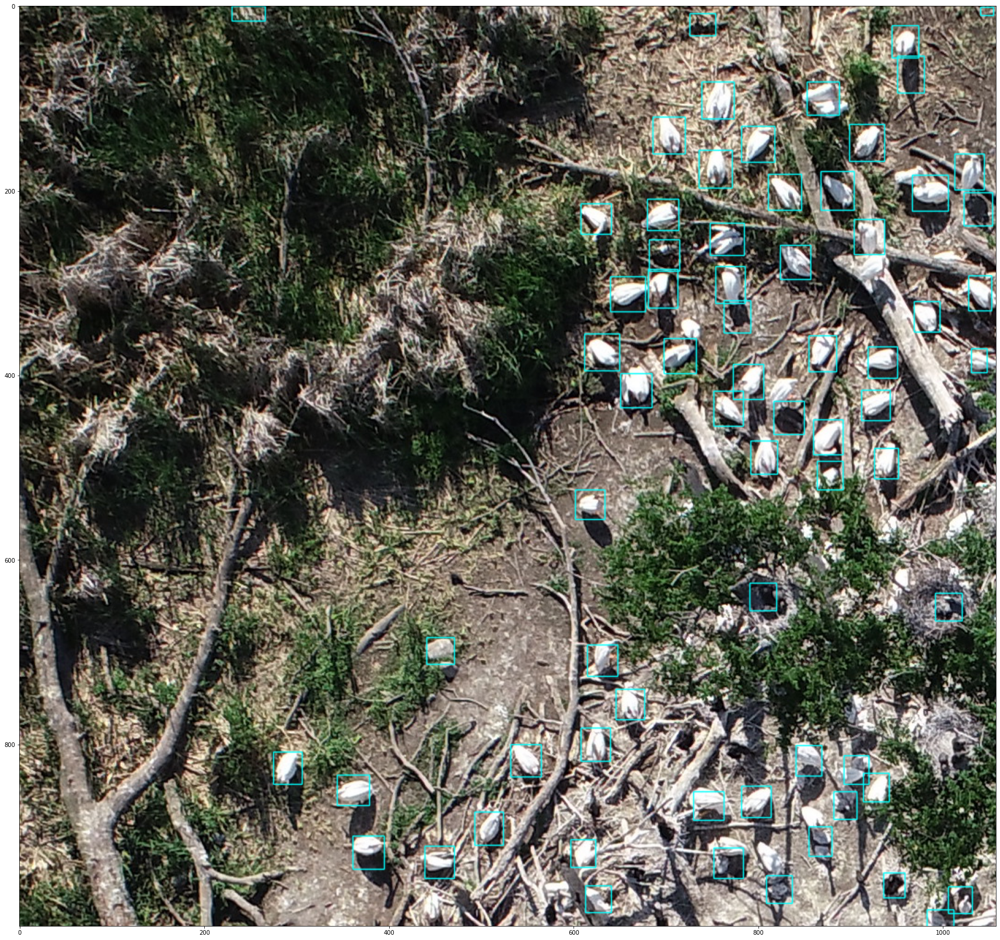

In [7]:
pyplot.figure(figsize=(30,30))
#matplotlib likes RGB colors, but DeepForest-pytorch depends on openCV which like BGR colors. To plot, invert the color order.
pyplot.imshow(plot[:,:,::-1])

# Read image and plot

# Download penguins orthomosaic

In [8]:
!wget https://www.dropbox.com/s/yi9m8xvju2j99jq/Cabo_Cariz_2017_Chinstrap_penguins.tif?dl=0 -O "penguins.tif"

--2021-06-30 20:12:57--  https://www.dropbox.com/s/yi9m8xvju2j99jq/Cabo_Cariz_2017_Chinstrap_penguins.tif?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.2.18, 2620:100:6019:18::a27d:412
Connecting to www.dropbox.com (www.dropbox.com)|162.125.2.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/yi9m8xvju2j99jq/Cabo_Cariz_2017_Chinstrap_penguins.tif [following]
--2021-06-30 20:12:58--  https://www.dropbox.com/s/raw/yi9m8xvju2j99jq/Cabo_Cariz_2017_Chinstrap_penguins.tif
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc3295311b58be89f6e151a787e3.dl.dropboxusercontent.com/cd/0/inline/BRbaPIbFob5XuEnKZoMBASW3s3h-7DT_7V-3QQ4E_pbkXnEaunLNJvTNuxMPnRmA3LljXWmRV-JHqBo6vwU8_1aUeCUKw0LMWTMWdWEJ0irYCjkeACm9PdL-sZI6PNTEjPG_LZEWsE0xtiU9S2SanAgT/file# [following]
--2021-06-30 20:12:58--  https://uc3295311b58be89f6e151a787e3.dl.dropboxusercontent.com/cd/0/inline/BRbaPIb

In [ ]:
raster = rasterio.open("penguins.tif").read()
#change from channels first (C, H, W) to channels last (H, W, C) for plotting
raster = np.rollaxis(raster,0,3)

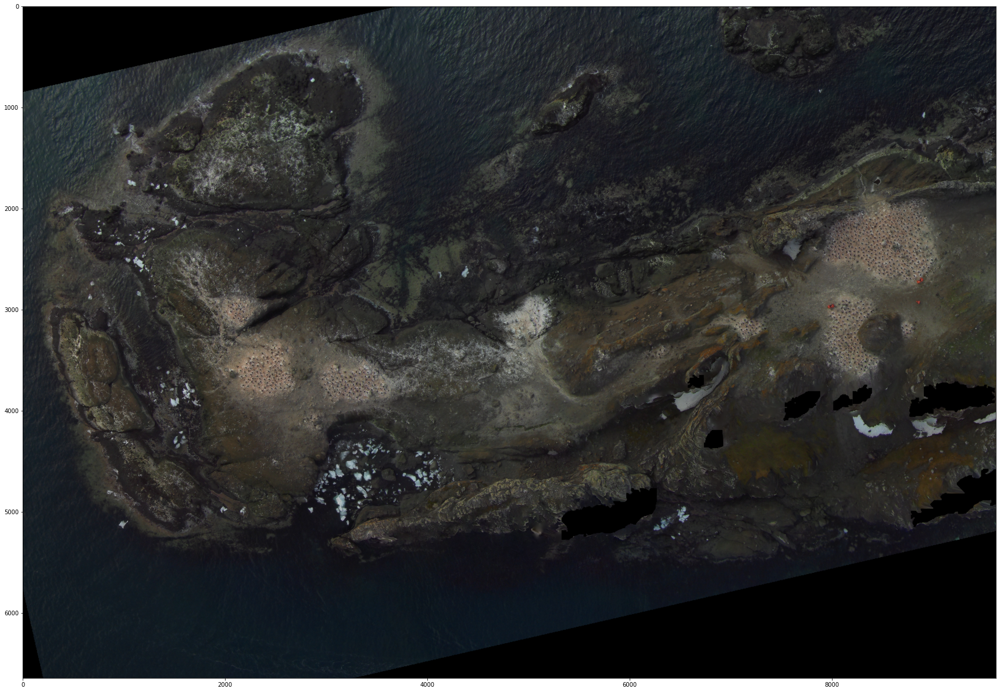

In [ ]:
pyplot.figure(figsize=(30,30))
pyplot.imshow(raster)

# Predict bird locations

In [ ]:
predicted_image =  m.predict_tile(raster_path= "penguins.tif", patch_size = 1000, return_plot=True)

  0%|          | 0/77 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/deepforest/predict.py:32: UserWarning: Image type is {}, transforming to float32. This assumes that the range of pixel values is 0-255, as opposed to 0-1.To suppress this warning, transform image (image.astype('float32')
  warnings.warn("Image type is {}, transforming to float32. This assumes that the range of pixel values is 0-255, as opposed to 0-1.To suppress this warning, transform image (image.astype('float32')")
100%|██████████| 77/77 [00:07<00:00, 10.82it/s]


2066 predictions in overlapping windows, applying non-max supression
1740 predictions kept after non-max suppression


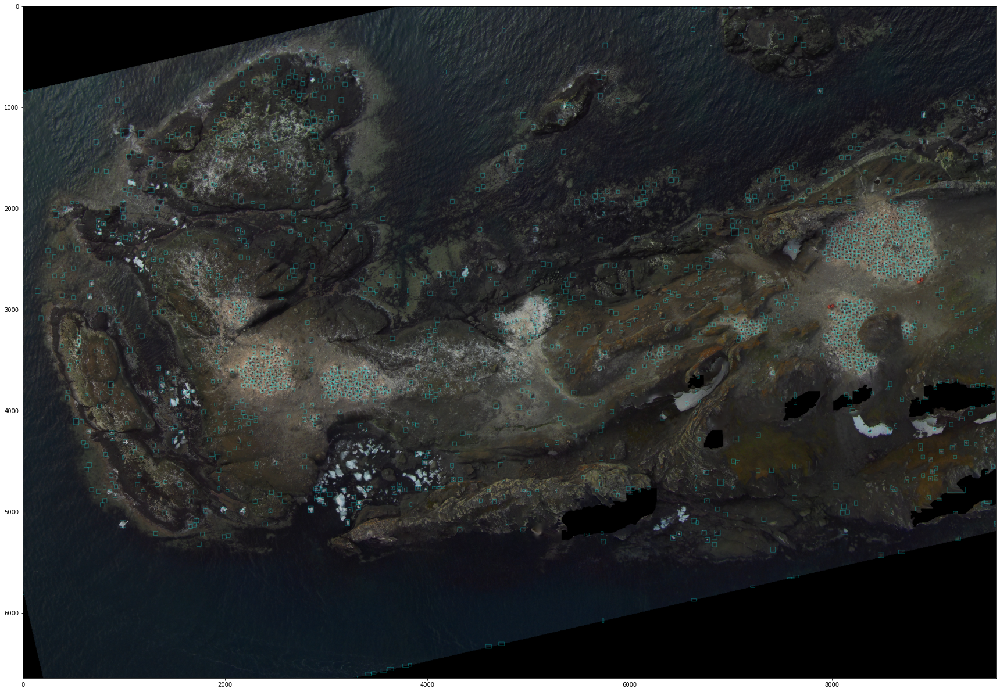

In [ ]:
pyplot.figure(figsize=(30,30))
pyplot.imshow(predicted_image[:,:,::-1])